<h1 style="background-color: #FECC00; padding: 10px; width: 100%; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.2), 0 6px 20px 0 rgba(0, 0, 0, 0.19); color: #007bff;">La poste</h1>



Consultation citoyenne “Imaginons La Poste de demain : 
quelles nouvelles activités aimeriez-vous que l'on 
développe ?


<hr style="border-width:4px;border-color:#FECC00">
<center><h1 style="color: #007bff;">Quelles actions mettre en œuvre pour satisfaire et développer notre clientèle ?</h1></center>
<hr style="border-width:4px;border-color:#FECC00">




In [3]:
#!pip install gensim
#!pip install spacy
#!python -m spacy download fr_core_news_sm
#!pip install  unidecode

<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">Importation des bibliothèques importantes</h1>


In [4]:
import spacy
from spacy.lang.fr.stop_words import STOP_WORDS

from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import pandas as pd
import json

import spacy
from spacy.lang.fr.stop_words import STOP_WORDS
import unidecode  # Pour enlever les accents
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np
from gensim.models import Word2Vec
import plotly.express as px
import numpy as np
from gensim.models import Word2Vec
from sklearn.manifold import TSNE


import numpy as np
from gensim.models import Word2Vec

from sklearn.cluster import KMeans

import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

<a id='1'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">1. Loading Data 💎</p>



In [5]:
# Charger les données depuis le fichier JSON
chemin_fichier = 'Data/ensai_2024_req_laposte_demain.json'
with open(chemin_fichier, 'r') as fichier:
    donnees = json.load(fichier)

# Initialisation d'une liste pour stocker les données agrégées
donnees_agregees = []

# Extraire les données nécessaires
for resultat in donnees['results']:
    identifiant = resultat['id']
    contenu = resultat['content']
    
    # Création d'un dictionnaire pour les votes et les sous-votes
    resume_votes = {'identifiant': identifiant, 'contenu': contenu}
    
    # Parcourir tous les votes de la proposition
    for vote in resultat['votes']:
        cle_vote = f"{vote['voteKey']}_total"  # Par exemple: 'agree_total'
        resume_votes[cle_vote] = vote['count']  # Utiliser le count directement
        
        # Parcourir tous les sous-votes de chaque vote
        for qualification in vote['qualifications']:
            cle_sous_vote = f"{vote['voteKey']}_{qualification['qualificationKey']}"
            resume_votes[cle_sous_vote] = qualification['count']
    
    # Ajouter le résumé des votes pour cette proposition dans la liste
    donnees_agregees.append(resume_votes)

# Convertir la liste des données en DataFrame
df_propositions = pd.DataFrame(donnees_agregees)

# Afficher le DataFrame
df_propositions


,identifiant,contenu,agree_total,agree_likeIt,agree_platitudeAgree,agree_doable,neutral_total,neutral_noOpinion,neutral_doNotUnderstand,neutral_doNotCare,disagree_total,disagree_impossible,disagree_noWay,disagree_platitudeDisagree
0,d1a29b08-5730-414a-8d63-dce64b8e6431,Il faut mettre sur pied des cours d'initiation...,128,34,7,48,51,13,1,14,26,7,7,8
1,a4ecca7a-7b25-4a8c-8715-07ce0cf66f95,Il faut que chaque client dispose d'un conseil...,147,26,16,57,85,31,1,27,55,32,4,12
2,c0ca9e9a-3513-4321-9171-b0e66c9c80f2,"Il faut organiser des ateliers, autour de ARDO...",258,44,31,91,310,85,83,56,113,11,34,38
3,57e02029-53bf-4aa5-96a6-ecb258b2adb5,Il faut la Poste s'organise pour fournir un se...,265,74,19,80,31,10,3,5,10,3,2,4
4,3cb3a85c-63ed-40b7-ad6d-56194a5eb32e,Il faut que la Poste propose des solutions d'a...,421,100,34,122,383,137,39,75,372,108,112,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,dcdfd92f-daf4-409c-bb36-d10601a7f314,"Il faut que les services qui existent déjà, te...",100,13,6,39,129,30,32,27,64,4,23,20
6474,4ecc3690-1d4b-4de8-8ac6-595c7b6725be,Il faut que tous les bureaux de poste (même da...,140,38,8,51,35,10,2,8,27,8,6,5
6475,0b387a50-4d31-492e-b172-7e8ac3d4e778,"Il faut qu'en bureau de poste, il y ait systém...",127,21,8,51,57,11,2,22,23,3,6,6
6476,c9744c74-0754-45bd-b38a-7ef3306e7184,Il faut que la Poste s'inscrive sur le volet p...,107,14,5,37,80,26,23,13,16,1,3,8


<a id='1'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">2. Preprocessing  💎</p>

In [6]:

# Charger le modèle de langue française
nlp = spacy.load('fr_core_news_sm')

# Créer une fonction de prétraitement avec spaCy
def pretraiter_texte(texte):
    # Créer un document spaCy
    doc = nlp(texte)
    # Générer une liste de tokens après lemmatisation, en excluant les mots vides, la ponctuation, 'falloir' et 'poste'
    tokens = [unidecode.unidecode(token.lemma_).lower() for token in doc if not token.is_stop and not token.is_punct and token.text.lower() not in STOP_WORDS and token.lemma_.lower() not in ["falloir", "poste"]]
    return ' '.join(tokens)  # Retourne les tokens sous forme de chaîne de caractères sans accents

# Appliquer la fonction de prétraitement à chaque proposition
df_propositions['tokens'] = df_propositions['contenu'].apply(pretraiter_texte)

# Afficher les résultats

df_propositions[['contenu', 'tokens']]


,contenu,tokens
0,Il faut mettre sur pied des cours d'initiation...,mettre pied cours initiation numerique gratuit...
1,Il faut que chaque client dispose d'un conseil...,client dispos conseiller personnaliser identifier
2,"Il faut organiser des ateliers, autour de ARDO...",organiser atelier autour ardoiz mise main bure...
3,Il faut la Poste s'organise pour fournir un se...,organise fournir service serieux territoire ho...
4,Il faut que la Poste propose des solutions d'a...,proposer solution adaptation logement senior c...
...,...,...
6473,"Il faut que les services qui existent déjà, te...",service exister bon coin fonctionner bien perd...
6474,Il faut que tous les bureaux de poste (même da...,bureau petit ville province etre pause meridien
6475,"Il faut qu'en bureau de poste, il y ait systém...",bureau systematiquement distributeur changeur ...
6476,Il faut que la Poste s'inscrive sur le volet p...,inscrive volet pedagogique grace formation acc...


# Test pour les majuscules 

In [7]:
# Exemples de mots au pluriel
mots_pluriels = ['voitures', 'chats', 'maisons', 'oiseaux', 'principaux']

# Appliquer la fonction de prétraitement aux mots pluriels
for mot in mots_pluriels:
    print(f"Mots d'origine : {mot}")
    print(f"Token traité : {pretraiter_texte(mot)}")
    print("\n")


Mots d'origine : voitures
Token traité : voiture


Mots d'origine : chats
Token traité : chat


Mots d'origine : maisons
Token traité : maison


Mots d'origine : oiseaux
Token traité : oiseau


Mots d'origine : principaux
Token traité : principal




<a id='2'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">2. Exploratory data analysis 📊</p>


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">WordCloud</h1>


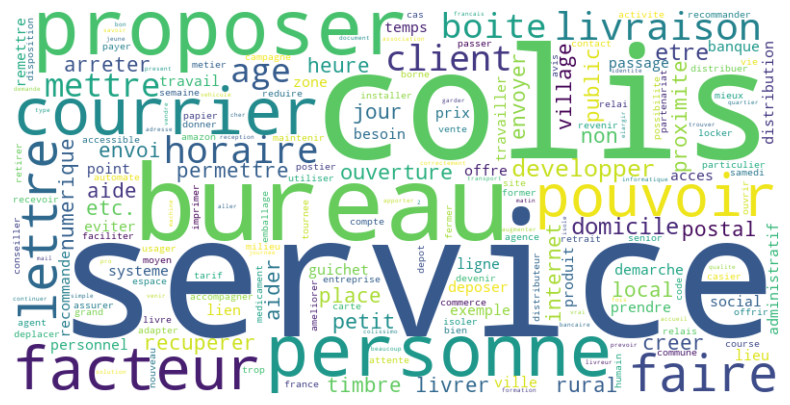

In [8]:
# Compter la fréquence des mots une seule fois par proposition
mots_par_proposition = (df_propositions['tokens'].str.split()
                        .apply(set)   # Convertir en ensemble pour compter chaque mot une fois par proposition
                        .apply(list)) # Reconvertir en liste pour le traitement suivant

# Calculer la fréquence totale des mots sur toutes les propositions
frequence_mots = Counter()
for mots in mots_par_proposition:
    frequence_mots.update(mots)

# Générer le nuage de mots en utilisant les fréquences calculées
nuage_mots = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(frequence_mots)

# Afficher le nuage de mots à l'aide de matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(nuage_mots, interpolation='bilinear')
plt.axis("off")
plt.show()

<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">Frequency of words</h1>


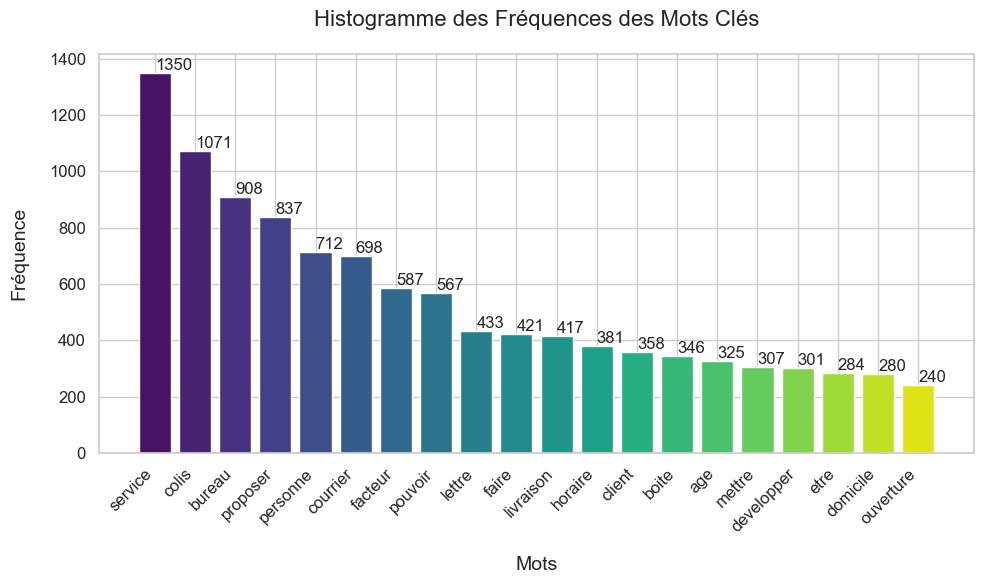

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convertir les fréquences des mots en dataframe pour faciliter la visualisation
df_frequence_mots = pd.DataFrame.from_dict(frequence_mots, orient='index', columns=['frequence'])
df_frequence_mots = df_frequence_mots.sort_values(by='frequence', ascending=False)
# Charger des styles de graphique
sns.set(style="whitegrid")

# Création de l'histogramme avec une palette de couleurs améliorée
plt.figure(figsize=(10, 6))
bars = plt.bar(df_frequence_mots.index[:20], df_frequence_mots['frequence'][:20], color=sns.color_palette("viridis", 20))

# Améliorer la lisibilité des étiquettes
plt.xlabel('Mots', fontsize=14, labelpad=15)
plt.ylabel('Fréquence', fontsize=14, labelpad=15)
plt.title('Histogramme des Fréquences des Mots Clés', fontsize=16, pad=20)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)

# Ajouter des annotations sur les barres les plus importantes
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), va='bottom')  # va: vertical alignment

# Montrer le graphique
plt.tight_layout()
plt.show()


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">Bi-grammes  les plus fréquents </h1>


## révéle des phrases ou des concepts récurrents dans les propositions.

C:\Users\diaki\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['neuf', 'qu', 'quelqu'] not in stop_words.
  warnings.warn(


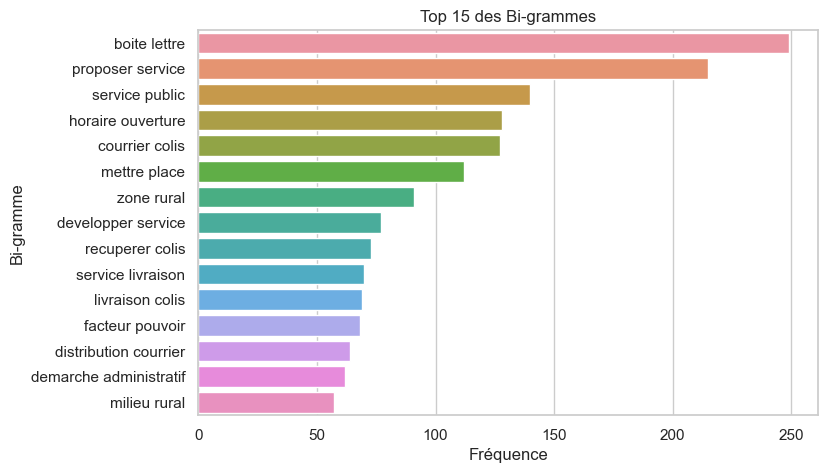

In [10]:
# Convertissez STOP_WORDS en une liste
stop_words_list = list(STOP_WORDS)

def get_top_n_gram(corpus, ngram_range, n=None):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words_list).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

# Afficher les 10 bi-grammes les plus communs
top_bi_grammes = get_top_n_gram(df_propositions['tokens'], (2,2), 15)
df_bi_grammes = pd.DataFrame(top_bi_grammes, columns=['Bi-gramme', 'Fréquence'])

plt.figure(figsize=(8,5))
sns.barplot(x='Fréquence', y='Bi-gramme', data=df_bi_grammes)
plt.title('Top 15 des Bi-grammes')
plt.show()


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">Tri-grammes les plus fréquents </h1>

C:\Users\diaki\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['neuf', 'qu', 'quelqu'] not in stop_words.
  warnings.warn(


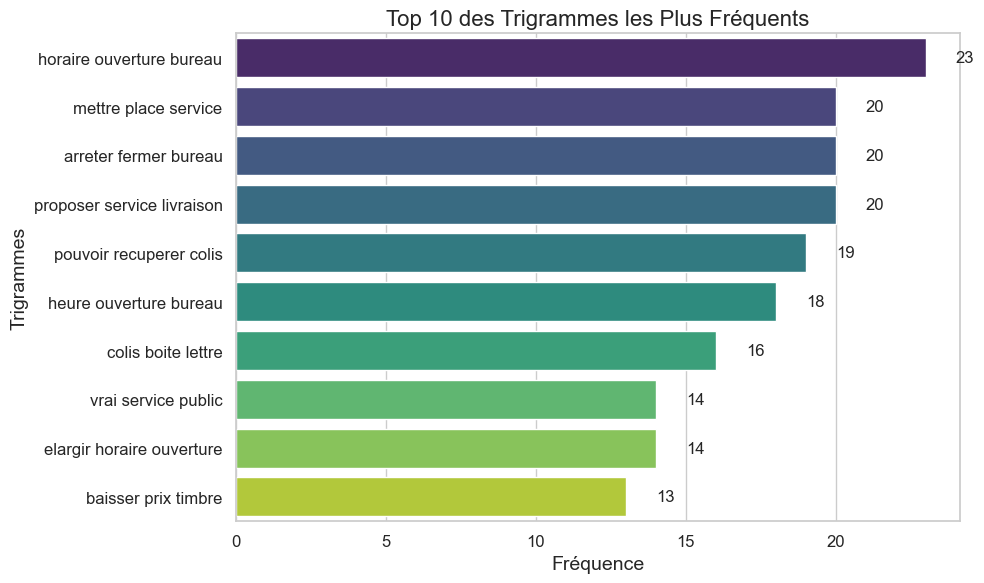

In [11]:

# Assurez-vous que stop_words_list est défini comme une liste des mots vides
stop_words_list = list(STOP_WORDS)

# Fonction pour obtenir les top n-grammes
def get_top_n_gram(corpus, ngram_range, n=None):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words_list).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Récupération des trigrammes les plus fréquents
top_trigrammes = get_top_n_gram(df_propositions['tokens'], (3,3), 10)
df_trigrammes = pd.DataFrame(top_trigrammes, columns=['Trigramme', 'Fréquence'])

# Création d'une visualisation avec seaborn
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")
bar_plot = sns.barplot(x='Fréquence', y='Trigramme', data=df_trigrammes, palette='viridis')

# Ajouter des annotations à chaque barre pour afficher la valeur de la fréquence
for p in bar_plot.patches:
    width = p.get_width()
    plt.text(width + 1,  # position horizontale de l'annotation (un peu après la fin de la barre)
             p.get_y() + p.get_height() / 2,  # position verticale (au centre de la barre)
             '{:1.0f}'.format(width),  # la valeur à annoter
             va='center')  # centrage vertical de l'annotation

plt.title('Top 10 des Trigrammes les Plus Fréquents', fontsize=16)
plt.xlabel('Fréquence', fontsize=14)
plt.ylabel('Trigrammes', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


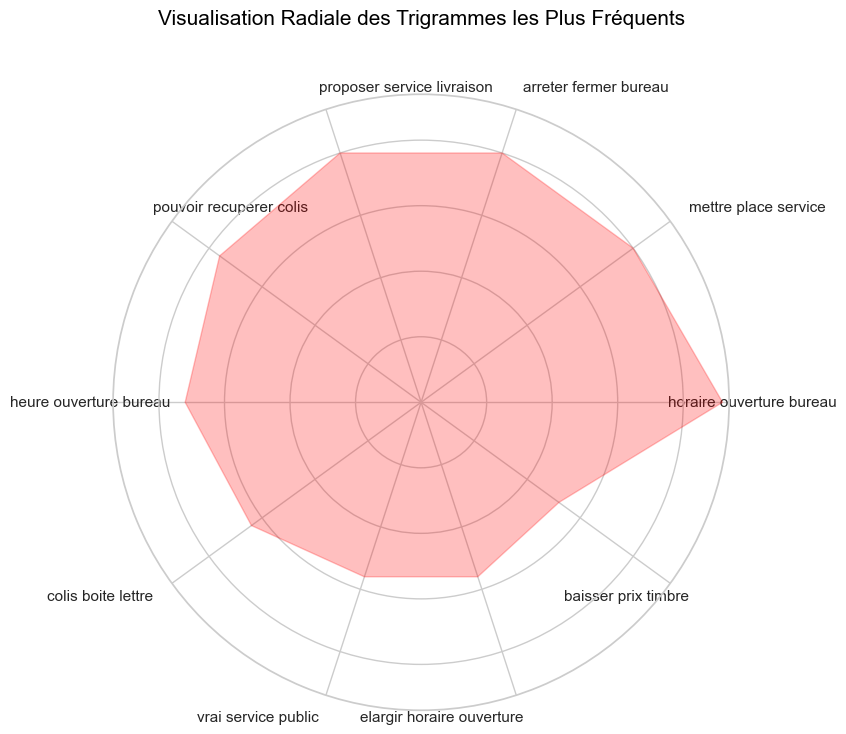

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que df_trigrammes contient vos données
labels = np.array(df_trigrammes['Trigramme'])
stats = df_trigrammes['Fréquence'].values

# Créer les angles du graphique
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()

# Fermer le cercle pour le graphique en connectant la fin au début
stats = np.concatenate((stats,[stats[0]]))  # Répéter la première valeur à la fin pour fermer le cercle
angles += angles[:1]  # Répéter le premier angle à la fin pour fermer le cercle

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.fill(angles, stats, color='red', alpha=0.25)
ax.set_yticklabels([])

# Ajuster les étiquettes des axes
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, horizontalalignment='right')

# Ajustement personnalisé pour l'alignement des étiquettes en haut et en bas
for label, angle in zip(ax.get_xticklabels(), angles):
    if angle in (0, np.pi):
        label.set_horizontalalignment('center')
    elif 0 < angle < np.pi:
        label.set_horizontalalignment('left')
    else:
        label.set_horizontalalignment('right')

plt.title('Visualisation Radiale des Trigrammes les Plus Fréquents', size=15, color='black', y=1.1)
plt.show()




<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">quatrigrammes les plus fréquents </h1>

C:\Users\diaki\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['neuf', 'qu', 'quelqu'] not in stop_words.
  warnings.warn(


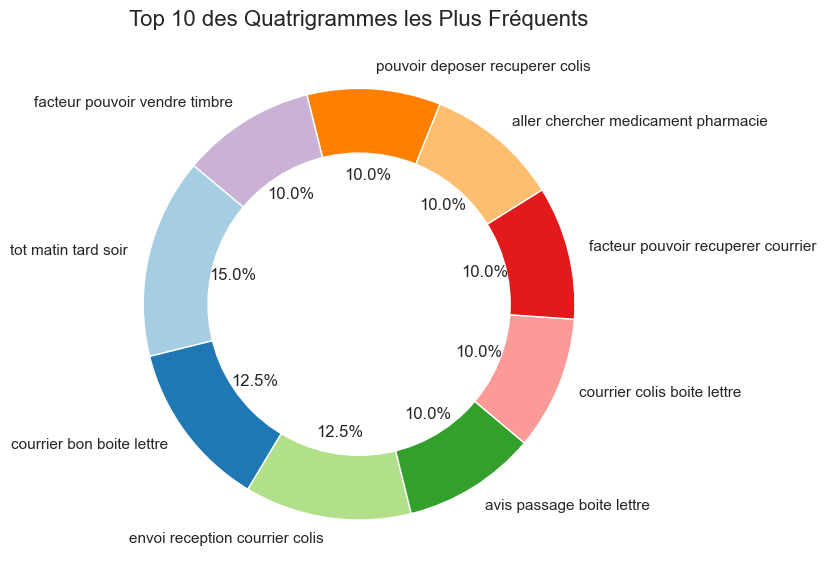

In [13]:

# Assurez-vous que stop_words_list est bien défini
stop_words_list = list(STOP_WORDS)

# Fonction pour extraire les top n-grammes
def get_top_n_gram(corpus, ngram_range, n=None):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words_list).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Récupération des quatrigrammes les plus fréquents
top_quatrigrammes = get_top_n_gram(df_propositions['tokens'], (4,4), 9)
df_quatrigrammes = pd.DataFrame(top_quatrigrammes, columns=['Quatrigramme', 'Fréquence'])

# Création d'un graphique en anneau
plt.figure(figsize=(10, 6))
plt.pie(df_quatrigrammes['Fréquence'], labels=df_quatrigrammes['Quatrigramme'], autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired(range(len(df_quatrigrammes))))
plt.gca().set_aspect('equal')

# Ajouter un cercle au centre pour former un anneau
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Top 10 des Quatrigrammes les Plus Fréquents', fontsize=16)
plt.tight_layout()
plt.show()


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">3 Propositions : plus de votes d'accords </h1>

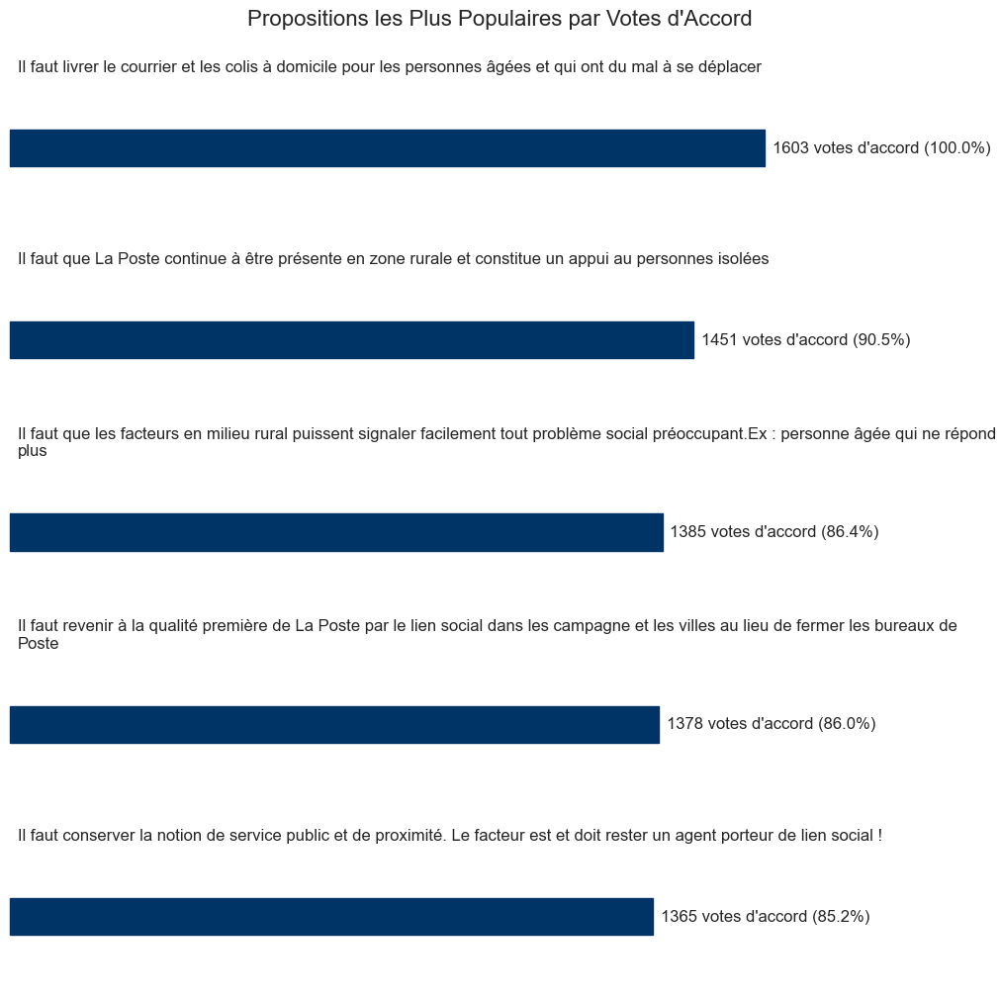

In [36]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Trier les propositions par le nombre total de votes d'accord
top_propositions = df_propositions.sort_values('agree_total', ascending=False).head(5)  # Affichage des 5 premières

# Supposons que top_propositions est déjà défini
max_votes = top_propositions['agree_total'].max()

# Ajuster la taille et l'espacement des barres
fig, axs = plt.subplots(len(top_propositions), 1, figsize=(10, len(top_propositions) * 2), constrained_layout=True)  # Hauteur réduite pour chaque proposition
night_blue_color = '#003366'  # Couleur bleu nuit

for i, (idx, row) in enumerate(top_propositions.iterrows()):
    # Positionner le texte au-dessus de la barre
    axs[i].text(0.01, 0.8, row['contenu'], ha='left', va='bottom', wrap=True, fontsize=12, transform=axs[i].transAxes)
    
    # Ajouter une jauge de progression
    percent = row['agree_total'] / max_votes
    axs[i].add_patch(patches.Rectangle((0, 0.3), width=percent, height=0.2, color=night_blue_color, transform=axs[i].transAxes, clip_on=False))
    
    # Texte à la fin de la barre de progression pour les votes
    axs[i].text(percent + 0.01, 0.4, f'{row["agree_total"]} votes d\'accord ({percent*100:.1f}%)', ha='left', va='center', fontsize=12, transform=axs[i].transAxes)
    
    axs[i].set_xlim(0, 1)
    axs[i].set_ylim(0, 1)
    axs[i].axis('off')  # Masquer les axes pour plus de clarté

plt.suptitle('Propositions les Plus Populaires par Votes d\'Accord', fontsize=16)
plt.show()


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">3 Propositions : plus de votes non d'accords </h1>

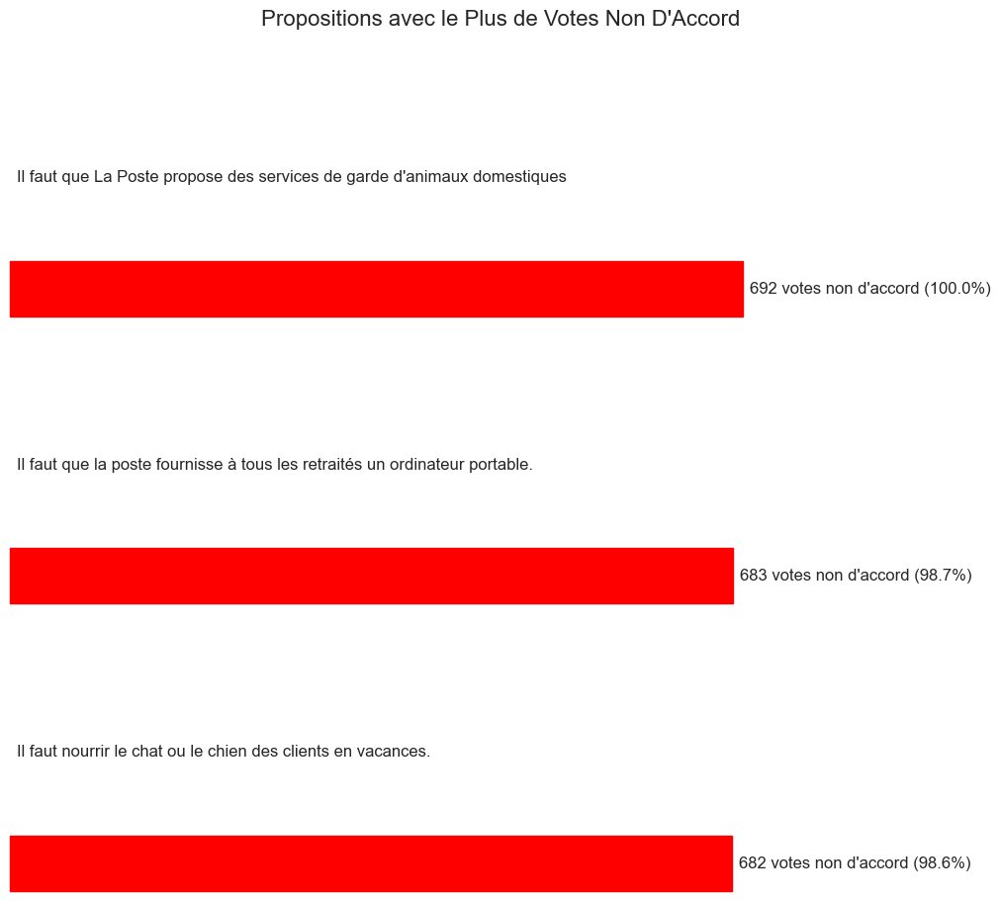

In [15]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# Trier les propositions par le nombre total de votes d'accord
top_propositions = df_propositions.sort_values('disagree_total', ascending=False).head(3)

# Supposons que top_propositions est déjà défini pour les votes de désaccord
max_disagree = top_propositions['disagree_total'].max()

fig, axs = plt.subplots(len(top_propositions), 1, figsize=(10, len(top_propositions) * 3), constrained_layout=True)

for i, (idx, row) in enumerate(top_propositions.iterrows()):
    # Ajouter un cadre pour chaque proposition
    axs[i].text(0.01, 0.5, row['contenu'], ha='left', va='center', wrap=True, fontsize=12, transform=axs[i].transAxes)
    # Ajouter une jauge de progression pour les votes de désaccord
    percent = row['disagree_total'] / max_disagree
    axs[i].add_patch(patches.Rectangle((0, 0), width=percent, height=0.2, color='red', transform=axs[i].transAxes, clip_on=False))
    axs[i].text(percent + 0.01, 0.1, f'{row["disagree_total"]} votes non d\'accord ({percent*100:.1f}%)', ha='left', va='center', fontsize=12, transform=axs[i].transAxes)
    
    axs[i].set_xlim(0, 1)
    axs[i].set_ylim(0, 1)
    axs[i].axis('off')  # Masquer les axes pour plus de clarté

plt.suptitle('Propositions avec le Plus de Votes Non D\'Accord', fontsize=16)
plt.show()



<a id='2'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">2. Word2vec</p>


https://datascientest.com/nlp-word-embedding-word2vec

Le word embedding désigne un ensemble de méthode d’apprentissage visant à représenter les mots d’un texte par des vecteurs de nombres réels. Pour rappel, le word embedding est capable en réduisant la dimensionde capturer le contexte, la similarité sémantique et syntaxique (genre, synonymes, …) d’un mot.
il est possible d’entraîner la matrice W de manière non supervisé avec simplement du texte à l’aide du célèbre algorithme Word2Vec.
Il existe deux variantes du Word2vec, les deux utilisent un réseau de neurones à 3 couches (1 couche d’entrée, 1 couche cachée, 1 couche de sortie) : Common Bag Of Words (CBOW) et Skip-gram.



Word2Vec est une méthode de traitement de langage naturel qui vise à mapper les mots dans un espace vectoriel. L'objectif est de capturer le contexte des mots et leur relation sémantique les uns avec les autres. L'idée principale est que les mots utilisés dans des contextes similaires sont souvent dotés de significations proches. En modélisant ces relations, Word2Vec produit des vecteurs de mots, où chaque mot est représenté par un vecteur dense de nombres flottants (c'est-à-dire une liste de nombres).

Expliquons les hyperparamètres utilisés dans le modèle Word2Vec :

- `vector_size` : La taille du vecteur pour chaque mot. Plus la taille est grande, plus le vecteur peut capturer de détails sur le mot, mais cela augmente également la complexité du modèle et le temps nécessaire pour l'entraîner.

- `window` : La taille de la fenêtre contextuelle autour du mot cible. Cela signifie combien de mots avant et après le mot cible seront pris en compte comme contexte lors de l'apprentissage du modèle.

- `min_count` : Le nombre minimal d'occurrences d'un mot dans le corpus pour qu'il soit pris en compte par le modèle. Les mots qui apparaissent moins souvent que cette limite sont ignorés.

- `workers` : Le nombre de fils d'exécution (ou de processus) utilisés pour entraîner le modèle. Augmenter ce nombre peut accélérer l'entraînement, mais cela dépend aussi des capacités de votre machine.

- `sg` : L'algorithmique de formation utilisée. Si `sg=0`, l'algorithme CBOW (Continuous Bag of Words) est utilisé; si `sg=1`, c'est l'algorithme Skip-gram. CBOW prédit le mot cible à partir du contexte, tandis que Skip-gram fait l'inverse et prédit le contexte à partir du mot cible.

### CBOW contre Skip-gram

**CBOW** : Ici, nous prenons le contexte (un ensemble de mots environnants) et prédisons le mot cible. CBOW est plus rapide et a une meilleure précision pour les mots fréquents.

**Skip-gram** : C'est l'opposé de CBOW. Skip-gram prend le mot cible et prédit le contexte. Il est plus lent, mais il est plus précis pour les mots moins fréquents et fonctionne mieux avec un corpus de grande taille.

En utilisant ces paramètres, vous entraînez un modèle qui peut non seulement saisir la sémantique des mots dans votre corpus mais également découvrir des relations subtiles entre les mots. Par exemple, le modèle peut comprendre que "banque" et "argent" sont souvent utilisés ensemble et sont liés de manière sémantique. Après l'entraînement, chaque mot dans votre corpus se voit attribuer un vecteur unique, qui peut être utilisé pour calculer des similarités entre les mots ou même pour résoudre des analogies.

En résumé, Word2Vec vous donne une représentation numérique des mots qui reflète leur signification et leur usage dans le langage naturel, ce qui est extrêmement utile pour une multitude de tâches en NLP.


Choix du modèle (Skip-Gram vs CBOW) : Vous avez choisi le modèle Skip-Gram, qui est généralement plus performant que CBOW sur des corpus de petite taille et avec des mots rares. Si nos données contiennent beaucoup de termes spécifiques ou uniques, c'est probablement le bon choix. Si le corpus était plus grand et plus générique, CBOW pourrait être plus rapide et tout aussi efficace.

In [16]:
from gensim.models import Word2Vec

# Préparation des données pour Word2Vec (nous utilisons les tokens sans transformation en chaîne de caractères)
sentences = df_propositions['tokens'].apply(lambda x: x.split())

# Calculer le nombre moyen de mots par proposition
average_window = int(df_propositions['tokens'].apply(lambda x: len(x.split())).mean())

# Entraînement du modèle Word2Vec avec la taille de fenêtre moyenne
model = Word2Vec(sentences=sentences, vector_size=80, window=10, min_count=3, workers=2, sg=1) # 0 :  CBOW et 1 : Skip-Gram


# Si nécessaire, affichez la valeur pour la justifier dans votre rapport
print(f"La taille de la fenêtre choisie est basée sur le nombre moyen de mots par proposition, qui est de {average_window}.")

# Exemple d'obtention de vecteur pour un mot
print(model.wv['age'])  # Remplacer 'service' par un mot présent dans votre corpus

# Exemple de recherche des mots les plus similaires
print(model.wv.most_similar('age', topn=5))  # Remplacer 'service' par un mot présent dans votre corpus


La taille de la fenêtre choisie est basée sur le nombre moyen de mots par proposition, qui est de 8.
[ 0.00471458 -0.5311045   0.06500375  0.14834319 -0.40359813 -0.00616597
  0.18824689 -0.0166974  -0.10478999  0.01663263  0.21228166 -0.24676287
  0.14854957  0.34863734  0.21405844  0.01779112  0.07198634 -0.02649171
 -0.34742418 -0.20974337 -0.07681497  0.23428568  0.26725528  0.10717766
  0.2757201   0.39134786  0.41453412  0.23861949 -0.2982565   0.0161352
  0.01866844  0.02962585  0.65106285 -0.2991625   0.0923919  -0.0584296
  0.29217726 -0.15018593 -0.15199098 -0.6059335  -0.20513907  0.16526942
 -0.34948373  0.20293422  0.14727722 -0.12377173  0.22465262  0.39048788
  0.0795258   0.09844047  0.21160759  0.03296262  0.31428695  0.40895498
  0.5471118   0.19499159 -0.00523013  0.05341997 -0.09576173 -0.16928683
  0.00420414  0.12271021  0.00870732 -0.18172947  0.10181402 -0.3211058
 -0.14652117  0.5547881   0.16717273  0.19786385  0.14959028 -0.30821902
 -0.28132433  0.12969477  

<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);">Test de similarité </h1>

In [17]:
# Trouver des mots similaires
similar_words = model.wv.most_similar('livraison', topn=10)
print(similar_words)
# Vous pouvez également vérifier la similarité entre deux mots spécifiques
similarity = model.wv.similarity('service', 'client')
print("La similarité entre 'service' et 'client':", similarity)

[('livrer', 0.9082008600234985), ('drive', 0.900041401386261), ('pharmacie', 0.8820497393608093), ('domicile', 0.8814361691474915), ('particulier', 0.879487156867981), ('alimentaire', 0.871292769908905), ('chercher', 0.869215190410614), ('necessite', 0.8688951730728149), ('collecte', 0.868022084236145), ('medicament', 0.864303708076477)]
La similarité entre 'service' et 'client': 0.8000184


In [18]:
# Assurez-vous que le mot 'campagne' est dans le vocabulaire du modèle avant de chercher les mots similaires
if 'campagne' in model.wv.key_to_index:
    similar_words = model.wv.most_similar('campagne', topn=10)
else:
    similar_words = "Le mot 'campagne' n'est pas dans le vocabulaire du modèle."

similar_words


[('habitant', 0.9823851585388184),
 ('epicerie', 0.9715909957885742),
 ('garder', 0.970312774181366),
 ('presence', 0.9697332978248596),
 ('proximite', 0.965081512928009),
 ('reouvrir', 0.962978184223175),
 ('maintenir', 0.9628826379776001),
 ('rouvrir', 0.9575873017311096),
 ('conserver', 0.957526683807373),
 ('contact', 0.9572747349739075)]

In [19]:
# Assurez-vous que le mot 'campagne' est dans le vocabulaire du modèle avant de chercher les mots similaires
if 'campagne' in model.wv.key_to_index:
    similar_words = model.wv.most_similar('rural', topn=10)
else:
    similar_words = "Le mot 'campagne' n'est pas dans le vocabulaire du modèle."

similar_words

[('proximite', 0.8854374289512634),
 ('commune', 0.8628835678100586),
 ('petit', 0.8626235127449036),
 ('milieu', 0.8478104472160339),
 ('village', 0.842533528804779),
 ('maintenir', 0.836234986782074),
 ('campagne', 0.8244259357452393),
 ('commerce', 0.8231335282325745),
 ('epicerie', 0.8211700916290283),
 ('habitant', 0.8133808374404907)]

In [20]:
# Assurez-vous que le mot 'campagne' est dans le vocabulaire du modèle avant de chercher les mots similaires
if 'courrier' in model.wv.key_to_index:
    similar_words = model.wv.most_similar('courrier', topn=10)
else:
    similar_words = "Le mot 'courrier' n'est pas dans le vocabulaire du modèle."

similar_words

[('distribuer', 0.9657958745956421),
 ('correctement', 0.9593439698219299),
 ('bon', 0.9332157969474792),
 ('passer', 0.9249522686004639),
 ('3', 0.9185209274291992),
 ('arriver', 0.9177501797676086),
 ('remettre', 0.9167772531509399),
 ('distribution', 0.9142448902130127),
 ('delai', 0.9138219356536865),
 ('poster', 0.9115825295448303)]

In [21]:
# Assurez-vous que le mot 'campagne' est dans le vocabulaire du modèle avant de chercher les mots similaires
if 'colis' in model.wv.key_to_index:
    similar_words = model.wv.most_similar('colis', topn=10)
else:
    similar_words = "Le mot 'colis' n'est pas dans le vocabulaire du modèle."

similar_words

[('recommande', 0.9688365459442139),
 ('reception', 0.961460530757904),
 ('deposer', 0.9611533284187317),
 ('mondial', 0.9602339863777161),
 ('relay', 0.9597293138504028),
 ('colissimo', 0.9584832787513733),
 ('sm', 0.9551893472671509),
 ('recommander', 0.9538586139678955),
 ('coli', 0.9515829086303711),
 ('signature', 0.9514995813369751)]

In [22]:
# Assurez-vous que le mot 'campagne' est dans le vocabulaire du modèle avant de chercher les mots similaires
if 'age' in model.wv.key_to_index:
    similar_words = model.wv.most_similar('age', topn=10)
else:
    similar_words = "Le mot 'campagne' n'est pas dans le vocabulaire du modèle."

similar_words

[('isoler', 0.9782574772834778),
 ('handicaper', 0.9731625914573669),
 ('repas', 0.9653589725494385),
 ('isole', 0.9633795022964478),
 ('apporter', 0.9557266235351562),
 ('visite', 0.9548433423042297),
 ('portage', 0.9496166706085205),
 ('personne', 0.9465342164039612),
 ('course', 0.9427404999732971),
 ('mobilite', 0.9426729679107666)]

In [23]:
# On fait la moyenne des vecteurs moyens mots 


<a id='2'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">2.a TSNE</p>


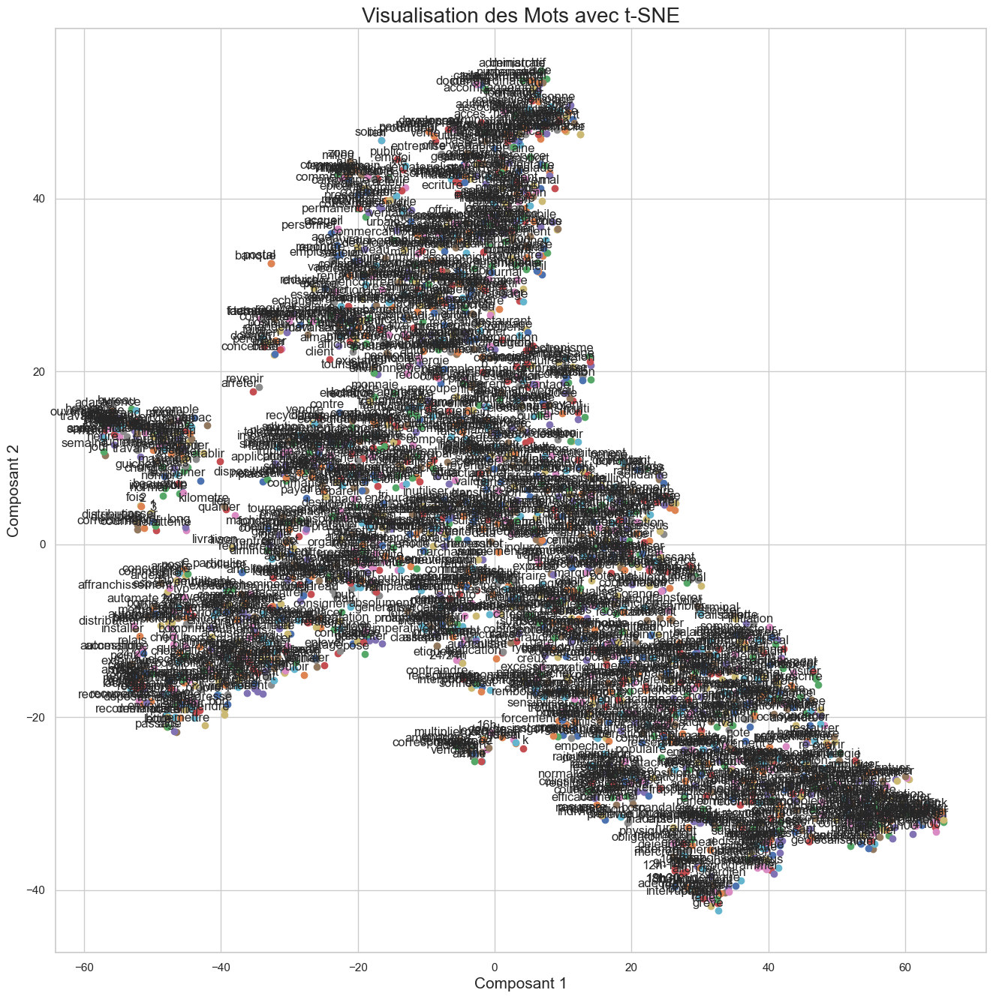

In [24]:
# Supposons que `model` est votre modèle Word2Vec déjà entraîné
words = list(model.wv.key_to_index.keys())  # Récupérer la liste des mots du modèle

# Extraction des vecteurs de mots correspondants
word_vectors = np.array([model.wv[word] for word in words])

# Réduction de dimensionnalité avec t-SNE
tsne = TSNE(n_components=2, random_state=0)
word_vectors_2d = tsne.fit_transform(word_vectors)

# Création du plot
plt.figure(figsize=(16, 16))  # Définir la taille de la figure
for i, word in enumerate(words):
    plt.scatter(word_vectors_2d[i, 0], word_vectors_2d[i, 1])  # Plot chaque point
    plt.annotate(word, xy=(word_vectors_2d[i, 0], word_vectors_2d[i, 1]), xytext=(5, 2),
                 textcoords='offset points', ha='right', va='bottom')

plt.title('Visualisation des Mots avec t-SNE', fontsize=20)
plt.xlabel('Composant 1', fontsize=15)
plt.ylabel('Composant 2', fontsize=15)
plt.grid(True)
plt.show()


In [25]:
import plotly.graph_objs as go
import numpy as np
from sklearn.manifold import TSNE

# Suppose model and sentences are already defined and trained as per your description
words = list(model.wv.key_to_index.keys())
word_vectors = np.array([model.wv[word] for word in words])

# Using t-SNE to reduce dimensionality
tsne = TSNE(n_components=2, random_state=0, perplexity=30, learning_rate=200)
word_vectors_2d = tsne.fit_transform(word_vectors)

# Create a Plotly scatter plot
fig = go.Figure()

# Adding each word to the scatter plot
for word, vec in zip(words, word_vectors_2d):
    fig.add_trace(go.Scatter(x=[vec[0]], y=[vec[1]], text=[word],
                             mode='markers+text', textposition='top center',
                             marker=dict(size=12, line=dict(width=2))))

# Highlight specific clusters if needed
# Example: Suppose 'service' and 'delivery' are considered similar
cluster_keywords = ['service', 'delivery', 'customer', 'support']
cluster_vectors = [word_vectors_2d[words.index(word)] for word in cluster_keywords if word in words]
cluster_x = [vec[0] for vec in cluster_vectors]
cluster_y = [vec[1] for vec in cluster_vectors]
fig.add_trace(go.Scatter(x=cluster_x, y=cluster_y, mode='markers',
                         marker=dict(size=15, color='rgba(255, 0, 0, 0.5)', line=dict(width=2, color='DarkRed')),
                         text=cluster_keywords, name='Customer Service Cluster'))

fig.update_layout(title='t-SNE Visualization of Word Vectors',
                  xaxis_title='Component 1',
                  yaxis_title='Component 2',
                  showlegend=True)

fig.show()


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);"> TSNE avec le top 200 mots </h1>

In [26]:
# Supposons que `model` est votre modèle Word2Vec déjà entraîné
words = list(model.wv.key_to_index.keys())  # Récupérer la liste des mots du modèle

# Extraction des vecteurs de mots correspondants
word_vectors = np.array([model.wv[word] for word in words])

# Sélectionner les mots les plus fréquents pour la visualisation
# Supposons que 'top_n' est le nombre de mots que vous voulez inclure (par exemple, 200 pour un corpus large)
top_n = 200
sorted_words = sorted(words, key=lambda word: model.wv.get_vecattr(word, "count"), reverse=True)[:top_n]
sorted_vectors = np.array([model.wv[word] for word in sorted_words])

# Réduction de dimensionnalité avec t-SNE
tsne = TSNE(n_components=2, random_state=0, perplexity=80, learning_rate=200)
word_vectors_2d = tsne.fit_transform(sorted_vectors)

# Création de la visualisation avec Plotly
fig = px.scatter(x=word_vectors_2d[:, 0], y=word_vectors_2d[:, 1], text=sorted_words,
                 labels={'x': 'Composant 1', 'y': 'Composant 2'},
                 title='Visualisation des Mots avec t-SNE')

fig.update_traces(textposition='top center')
fig.update_layout(height=1000, width=1000, title_font_size=30)
fig.show()


<a id='2'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">3 Calcul du Vecteur Moyen pour Chaque Proposition</p>

L'étape que vous avez notée, consistant à calculer un vecteur moyen pour chaque proposition, est une pratique courante en traitement du langage naturel (NLP) lorsqu'on utilise des modèles comme Word2Vec. Cette méthode permet de passer de vecteurs de mots à des vecteurs de phrases ou de textes, ce qui est utile pour de nombreuses applications, y compris le clustering de textes.

### Pourquoi Calculer un Vecteur Moyen par Proposition?
1. **Représentation Fixe** : Chaque proposition peut varier en longueur et en contenu, mais en prenant la moyenne de tous les vecteurs de mots dans une proposition, vous obtenez un seul vecteur de taille fixe qui représente l'ensemble du texte. Cela facilite les comparaisons et d'autres traitements.

2. **Préparation pour le Clustering** : Avec un vecteur par proposition, vous pouvez appliquer des techniques de machine learning classiques, comme le clustering, pour regrouper des propositions similaires. Cela peut être utilisé pour découvrir des thèmes récurrents, segmenter les données textuelles, ou identifier des propositions qui partagent des idées communes.

### Étape 4 : Calcul du Vecteur Moyen pour Chaque Proposition

Voici comment vous pouvez procéder pour calculer un vecteur moyen pour chaque proposition à partir des vecteurs de mots générés par Word2Vec:


### Ce qui suit après cette étape:
Une fois que vous avez un vecteur représentant chaque proposition, vous pouvez appliquer des méthodes de clustering comme K-means pour regrouper les propositions en fonction de leur similarité sémantique. Voici un exemple simple d'application de K-means:


Cela permettra de voir comment les propositions sont regroupées et pourrait révéler des patterns ou des thèmes communs dans les données. Cette méthode est puissante pour organiser et comprendre de grandes quantités de texte.

# Explication à donner 

Pour les mots connus, elle calcule la moyenne de leurs vecteurs. Cette moyenne devient le vecteur représentatif de la proposition entière, capturant ainsi l'essence de tous les mots qu'elle contient dans un seul vecteur.

Pour analyser les propositions de manière automatisée, nous transformons chaque texte en une série de points dans un espace numérique, où chaque point représente un mot. Ensuite, pour chaque proposition, nous calculons un point moyen qui représente l'ensemble des mots de cette proposition. Cela nous aide à comprendre et comparer les propositions de manière quantitative plutôt que textuelle

In [27]:
# Supposons que `model` est votre modèle Word2Vec et `df_propositions` contient vos propositions textuelles
sentences = df_propositions['tokens'].apply(lambda x: x.split())  # Liste de mots pour chaque proposition

# Fonction pour calculer le vecteur moyen d'une liste de mots
def sentence_vector(sentence, model):
    vectors = [model.wv[word] for word in sentence if word in model.wv]
    if len(vectors) == 0:
        return np.zeros(model.vector_size)  # Retourne un vecteur de zéros si la proposition ne contient aucun mot connu
    return np.mean(vectors, axis=0)

# Appliquer la fonction à chaque proposition
df_propositions['sentence_vector'] = sentences.apply(lambda x: sentence_vector(x, model))

# Affichage des premiers vecteurs de proposition
df_propositions['sentence_vector'].head()


0    [0.024402332, -0.13435857, 0.09218139, 0.13427...
1    [0.024783488, -0.11353199, 0.08208057, 0.09151...
2    [0.040489744, -0.04955149, 0.07766879, 0.12753...
3    [0.03835554, -0.042809904, 0.01027835, 0.15173...
4    [0.0077535836, -0.16897932, 0.10453931, 0.1690...
Name: sentence_vector, dtype: object

In [28]:
df_propositions

,identifiant,contenu,agree_total,agree_likeIt,agree_platitudeAgree,agree_doable,neutral_total,neutral_noOpinion,neutral_doNotUnderstand,neutral_doNotCare,disagree_total,disagree_impossible,disagree_noWay,disagree_platitudeDisagree,tokens,sentence_vector
0,d1a29b08-5730-414a-8d63-dce64b8e6431,Il faut mettre sur pied des cours d'initiation...,128,34,7,48,51,13,1,14,26,7,7,8,mettre pied cours initiation numerique gratuit...,"[0.024402332, -0.13435857, 0.09218139, 0.13427..."
1,a4ecca7a-7b25-4a8c-8715-07ce0cf66f95,Il faut que chaque client dispose d'un conseil...,147,26,16,57,85,31,1,27,55,32,4,12,client dispos conseiller personnaliser identifier,"[0.024783488, -0.11353199, 0.08208057, 0.09151..."
2,c0ca9e9a-3513-4321-9171-b0e66c9c80f2,"Il faut organiser des ateliers, autour de ARDO...",258,44,31,91,310,85,83,56,113,11,34,38,organiser atelier autour ardoiz mise main bure...,"[0.040489744, -0.04955149, 0.07766879, 0.12753..."
3,57e02029-53bf-4aa5-96a6-ecb258b2adb5,Il faut la Poste s'organise pour fournir un se...,265,74,19,80,31,10,3,5,10,3,2,4,organise fournir service serieux territoire ho...,"[0.03835554, -0.042809904, 0.01027835, 0.15173..."
4,3cb3a85c-63ed-40b7-ad6d-56194a5eb32e,Il faut que la Poste propose des solutions d'a...,421,100,34,122,383,137,39,75,372,108,112,57,proposer solution adaptation logement senior c...,"[0.0077535836, -0.16897932, 0.10453931, 0.1690..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,dcdfd92f-daf4-409c-bb36-d10601a7f314,"Il faut que les services qui existent déjà, te...",100,13,6,39,129,30,32,27,64,4,23,20,service exister bon coin fonctionner bien perd...,"[-0.0033582412, -0.08725197, 0.110850625, 0.08..."
6474,4ecc3690-1d4b-4de8-8ac6-595c7b6725be,Il faut que tous les bureaux de poste (même da...,140,38,8,51,35,10,2,8,27,8,6,5,bureau petit ville province etre pause meridien,"[0.045002677, 0.006969592, -0.022307059, 0.180..."
6475,0b387a50-4d31-492e-b172-7e8ac3d4e778,"Il faut qu'en bureau de poste, il y ait systém...",127,21,8,51,57,11,2,22,23,3,6,6,bureau systematiquement distributeur changeur ...,"[0.07556041, 0.011409309, 0.03284737, 0.172412..."
6476,c9744c74-0754-45bd-b38a-7ef3306e7184,Il faut que la Poste s'inscrive sur le volet p...,107,14,5,37,80,26,23,13,16,1,3,8,inscrive volet pedagogique grace formation acc...,"[0.03453755, -0.048474967, 0.043874737, 0.1519..."



<a id='2'></a>
# <p style="background-color:skyblue; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">4 K-means</p>

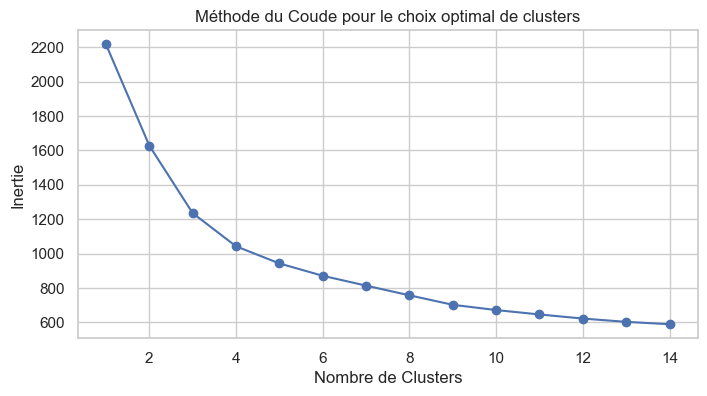

In [29]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

# Conversion des vecteurs de liste en array NumPy pour le clustering
vectors = np.array(list(df_propositions['sentence_vector']))

# Calculer l'inertie pour un range de nombre de clusters
inertias = []
for k in range(1, 15):  # Test de 1 à 14 clusters
    kmeans = KMeans(n_clusters=k, random_state=0).fit(vectors)
    inertias.append(kmeans.inertia_)

# Visualisation de la méthode du coude
plt.figure(figsize=(8, 4))
plt.plot(range(1, 15), inertias, marker='o')
plt.title('Méthode du Coude pour le choix optimal de clusters')
plt.xlabel('Nombre de Clusters')
plt.ylabel('Inertie')
plt.grid(True)
plt.show()


In [30]:
# Conversion des vecteurs de liste en array NumPy pour le clustering
vectors = np.array(list(df_propositions['sentence_vector']))

# Application de K-means
kmeans = KMeans(n_clusters=6, random_state=0).fit(vectors)  # Vous pouvez ajuster le nombre de clusters
df_propositions['cluster'] = kmeans.labels_

# Visualisation des résultats
print(df_propositions[['contenu', 'cluster']].head())


                                             contenu  cluster
0  Il faut mettre sur pied des cours d'initiation...        5
1  Il faut que chaque client dispose d'un conseil...        4
2  Il faut organiser des ateliers, autour de ARDO...        4
3  Il faut la Poste s'organise pour fournir un se...        1
4  Il faut que la Poste propose des solutions d'a...        2


<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);"> Visualisation des Clusters avec t-SNE et Plotly </h1>

In [31]:
# Assurons-nous que vos vecteurs sont stockés dans un array NumPy
vectors = np.array(list(df_propositions['sentence_vector']))

# Application de t-SNE pour réduire la dimensionnalité
tsne = TSNE(n_components=2, random_state=0, perplexity=30, learning_rate=200)
vectors_2d = tsne.fit_transform(vectors)

# Création de la visualisation avec Plotly
fig = px.scatter(
    x=vectors_2d[:, 0], y=vectors_2d[:, 1],
    color=df_propositions['cluster'].astype(str),  # Utilisation des clusters comme couleur
    labels={'color': 'Cluster'},
    title='Visualisation des Clusters de Propositions',
    hover_data=[df_propositions['contenu']],  # Ajout du contenu de chaque proposition au survol
    width=800, height=800
)

# Ajout de personnalisation
fig.update_traces(marker=dict(size=12, line=dict(width=2, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.update_layout(legend_title_text='Cluster', title_font_size=24)
fig.show()



<h1 style="background-color: #cfd4d1; padding: 10px; width: 600px; font-size: 20px; text-align: center; box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.15), 0 6px 20px 0 rgba(0, 0, 0, 0.15);"> Analyse des Mots Clés par Cluster </h1>

### 1. Extraire les Mots Clés par Cluster

In [32]:
import numpy as np
from collections import Counter

# Fonction pour obtenir les mots clés d'un cluster
def get_keywords_for_cluster(cluster_idx, df, num_keywords=10):
    # Filtrer les propositions par cluster
    cluster_sentences = df[df['cluster'] == cluster_idx]['tokens'].apply(lambda x: x.split())
    # Compter la fréquence des mots dans ce cluster
    word_count = Counter(word for sentence in cluster_sentences for word in sentence if word in model.wv)
    # Sélectionner les mots les plus fréquents
    most_common_words = word_count.most_common(num_keywords)
    return most_common_words

# Calculer et afficher les mots clés pour chaque cluster
cluster_keywords = {}
for i in range(6):  # Supposons que vous avez 8 clusters
    cluster_keywords[i] = get_keywords_for_cluster(i, df_propositions)
    print(f"Cluster {i} mots clés: {cluster_keywords[i]}")


Cluster 0 mots clés: [('courrier', 392), ('facteur', 336), ('colis', 152), ('faire', 147), ('distribution', 120), ('jour', 107), ('temps', 100), ('service', 96), ('pouvoir', 83), ('distribuer', 81)]
Cluster 1 mots clés: [('horaire', 339), ('bureau', 283), ('ouverture', 205), ('travailler', 78), ('heure', 73), ('etre', 71), ('jour', 65), ('ouvrir', 59), ('samedi', 56), ('adapter', 52)]
Cluster 2 mots clés: [('personne', 526), ('service', 319), ('age', 279), ('aide', 188), ('proposer', 162), ('aider', 136), ('administratif', 128), ('numerique', 123), ('demarche', 122), ('domicile', 119)]
Cluster 3 mots clés: [('colis', 686), ('lettre', 344), ('boite', 269), ('pouvoir', 223), ('courrier', 193), ('recuperer', 130), ('deposer', 120), ('bureau', 106), ('envoi', 102), ('envoyer', 100)]
Cluster 4 mots clés: [('service', 417), ('proposer', 360), ('colis', 231), ('client', 174), ('livraison', 151), ('bureau', 146), ('pouvoir', 141), ('timbre', 140), ('mettre', 130), ('postal', 110)]
Cluster 5 mo



### Attribution de Thèmes Basés sur les Mots Clés

- **Cluster 0**: "Distribution du Courrier" – Le cluster contient des mots comme 'facteur', 'courrier', 'distribution', 'colis', et 'tournee'. Cela suggère une forte concentration sur le métier traditionnel de distribution de courrier et de colis.
- **Cluster 1**: "Services Ruraux" – Des mots comme 'bureau', 'rural', 'village', 'proximite' indiquent des services postaux dans les zones rurales et de proximité.
- **Cluster 2**: "Solutions de Récupération de Colis" – Mots clés comme 'colis', 'recuperer', 'locker', 'casier' mettent en évidence des services pour faciliter la récupération de colis.
- **Cluster 3**: "Horaires d’Ouverture" – Ce cluster avec 'horaire', 'ouverture', 'samedi' semble concerner les horaires d’ouverture des bureaux de poste.
- **Cluster 4**: "Développement de Services Locaux" – Les mots 'service', 'proposer', 'developper', 'client', 'local' suggèrent l’extension des services au niveau local.
- **Cluster 5**: "Gestion du Courrier et des Colis" – Avec 'lettre', 'colis', 'boite', 'courrier', ce cluster se concentre sur la gestion des lettres et des colis.
- **Cluster 6**: "Assistance aux Personnes Âgées" – Des mots comme 'personne', 'age', 'aide', 'aider' montrent un focus sur les services d'assistance, particulièrement pour les personnes âgées.
- **Cluster 7**: "Services de Livraison et d'Envoi" – Des termes comme 'colis', 'livraison', 'envoi' indiquent un cluster centré sur les services de livraison et d'envoi.


In [37]:
def assign_theme(cluster_keywords):
    theme_keywords = {
        "Distribution de Courrier et Colis": ["courrier", "facteur", "colis", "distribution"],
        "Horaires et Ouverture de Bureau": ["horaire", "ouverture", "bureau"],
        "Services aux Personnes Âgées et Aide Administrative": ["personne", "age", "aide", "administratif"],
        "Gestion et Récupération de Colis": ["colis", "lettre", "boite", "recuperer", "deposer"],
        "Services Clients et Livraison": ["service", "client", "livraison", "proposer"],
        "Services de Proximité en Zone Rurale": ["service", "rural", "proximite", "public", "local"]
    }
    for theme, keywords in theme_keywords.items():
        if any(word in cluster_keywords for word in keywords):
            return theme
    return "Thème Général"

cluster_themes = {i: assign_theme([word for word, _ in cluster_keywords[i]]) for i in range(6)}


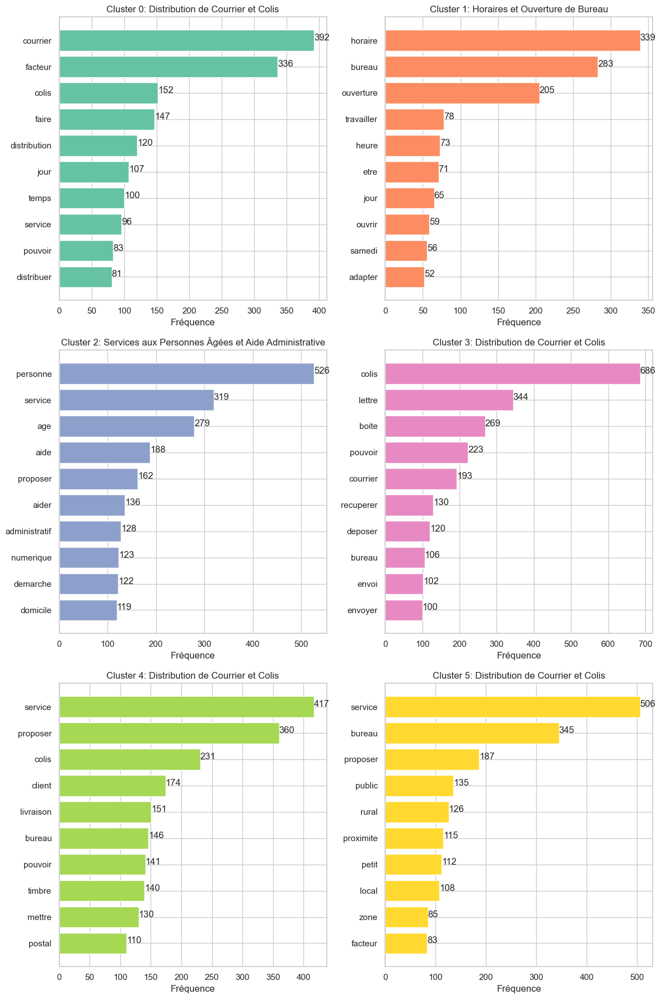

In [38]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 2, figsize=(12, 18))  # Ajuster selon le nombre de clusters
axes = axes.flatten()  # Aplatir le tableau d'axes si nécessaire

for i in range(6):
    words, freqs = zip(*cluster_keywords[i])
    axes[i].barh(words, freqs, color=plt.cm.Set2(i % 8))
    axes[i].set_title(f'Cluster {i}: {cluster_themes[i]}')
    axes[i].invert_yaxis()  # Inverser l'axe pour que les barres soient du haut vers le bas
    axes[i].set_xlabel('Fréquence')
    for index, value in enumerate(freqs):
        axes[i].text(value, index, str(value))

plt.tight_layout()
plt.show()
